# GMTSAR Python: S1A_Stack_CPGF_T173

In [1]:
import sys
import os

In [2]:
import xarray as xr
import numpy as np
import dask
import pandas as pd
# supress numpy warnings
import warnings
warnings.filterwarnings('ignore')
import glob
from io import StringIO
import xmltodict
from scipy.ndimage.filters import gaussian_filter

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
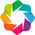

In [3]:
# to show PDF file
from wand.image import Image as WImage
# plotting modules
import hvplot.xarray  # noqa
import holoviews as hv
from holoviews import opts
hv.extension('bokeh', 'matplotlib')
pd.options.plotting.backend = 'holoviews'

In [4]:
# define Pandas display settings
pd.set_option('display.max_rows', 50)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
pd.set_option('display.max_colwidth', None)

## Custom modules

In [5]:
sys.path.append(os.path.join(os.environ['GMTSAR'],'gmtsar', 'py'))

from intf_ra2ll import intf_ra2ll_matrix, intf_ra2ll
from trans_ra2ll import trans_ra2ll_matrix
from update_PRM import PRM
from prep_data import S1A_Filelist

## Show Satellite Frame on DEM

In [6]:
import xmltodict
with open('raw_orig/s1a-iw1-slc-vv-20150121t134413-20150121t134424-004270-005317-001.xml') as fd:
    doc = xmltodict.parse(fd.read())
geoloc = doc['product']['geolocationGrid']['geolocationGridPointList']
print ('count', geoloc['@count'], len(geoloc['geolocationGridPoint']))
geoloc_df = pd.DataFrame(geoloc['geolocationGridPoint']).applymap(lambda val : pd.to_numeric(val,errors='ignore'))
geoloc_df

count 105 105


,azimuthTime,slantRangeTime,line,pixel,latitude,longitude,height,incidenceAngle,elevationAngle
0,2015-01-21T13:44:13.183988,0.005338,0,0,32.617103,-114.641264,50.782374,30.727594,27.413105
1,2015-01-21T13:44:13.183996,0.005355,0,1080,32.625402,-114.692486,50.782374,31.071751,27.713251
2,2015-01-21T13:44:13.184004,0.005372,0,2160,32.633599,-114.743214,50.782374,31.410533,28.008455
3,2015-01-21T13:44:13.184013,0.005389,0,3240,32.641697,-114.793466,50.782374,31.744124,28.298884
4,2015-01-21T13:44:13.184021,0.005405,0,4320,32.649701,-114.843261,50.782374,32.072699,28.584697
...,...,...,...,...,...,...,...,...,...
100,2015-01-21T13:44:24.812401,0.005607,6543,17280,32.039709,-115.568773,358.801093,35.731383,31.751680
101,2015-01-21T13:44:24.812409,0.005624,6543,18360,32.046720,-115.613447,358.801093,36.006549,31.988268
102,2015-01-21T13:44:24.812418,0.005640,6543,19440,32.053671,-115.657835,358.801093,36.278402,32.221797
103,2015-01-21T13:44:24.812426,0.005657,6543,20520,32.060561,-115.701945,358.801093,36.547028,32.452342


In [7]:
# xml file boundaries
print (geoloc_df.line.min(), geoloc_df.line.max())
print (geoloc_df.pixel.min(), geoloc_df.pixel.max())
#21572, 5484 PRM boundaries

0 6543
0 21597


In [8]:
ymin, ymax = geoloc_df.latitude.min(), geoloc_df.latitude.max()
#print ('ymin, ymax', ymin, ymax)
xmin, xmax = geoloc_df.longitude.min(), geoloc_df.longitude.max()
#print ('xmin, xmax', xmin, xmax)

dem = xr.open_dataarray('topo/dem.grd')
dem_area = dem.sel(lat=slice(ymin, ymax), lon=slice(xmin,xmax))

# remove sub-pixel noise
dem_area.values = gaussian_filter(dem_area.values,1)

In [9]:
title = 'DEM Area for Sentinel1 Frame'

#https://holoviz.org/tutorial/Composing_Plots.html
dem_area.hvplot(invert=True, cmap='kbc', alpha=1, title=title) * \
    geoloc_df.plot.scatter(y='longitude', x='latitude', c='pixel', cmap='jet')
#xticks=[(-115, 'a'), (-115.5, 'b')]

:Overlay
   .Image.I   :Image   [lat,lon]   (z)
   .Scatter.I :Scatter   [latitude]   (longitude,pixel)

## Stage 1. Make topo_ra

## trans.dat - file generated by llt_grid2rat (r a topo lon lat)"

In [10]:
prm = PRM.from_file(f'topo/master.PRM')
prm

Object PRM (topo/master.PRM) 59 items
                      value
name                       
num_valid_az           5484
nrows                  5484
first_line                1
deskew                    n
caltone                   0
...                     ...
earth_radius     6.3723e+06
SC_height            699406
SC_height_start      699348
SC_height_end        699464
fd1                       0

[59 rows x 1 columns]

## RA DEM Grid

In [11]:
%%time
topo_ra = prm.topo_ra(dem_area, trans_dat_tofile='topo/trans.dat', topo_ra_tofile='topo/topo_ra.grd')

Range and azimuth decimation: 2/2
CPU times: user 38.8 s, sys: 6.76 s, total: 45.5 s
Wall time: 1min 4s


In [12]:
topo_ra.hvplot(cmap='kbc')